# **Norvartis Hackathon Challenge 1- Predict If Server Will Be Hacked**

Importing required Libraries

In [1]:
import numpy as np
import pandas as pd
from pandas_profiling import ProfileReport
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from datetime import date,datetime,timedelta
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import recall_score

Reading training and test datasets from local

In [2]:
dataset=pd.read_csv("F:\\Machine Learning\\HackerEarth\\Novartis Challenge\\Challenge 1 - Hack Prediction\\6a62a5b4967411ea\\Dataset\\Train.csv") 

test_dataset=pd.read_csv("F:\\Machine Learning\\HackerEarth\\Novartis Challenge\\Challenge 1 - Hack Prediction\\6a62a5b4967411ea\\Dataset\\Test.csv") 

Performing exploratory data analytics to understand feature corelations and interactions

In [3]:
profile = ProfileReport(dataset)
#prof.to_file(output_file='F:\\Machine Learning\\HackerEarth\\Novartis Challenge\\Challenge 1 - Hack Prediction\\6a62a5b4967411ea\\Dataset\\hack_prediction.html')
profile.to_notebook_iframe()

#Building test data profile
test_profile=ProfileReport(test_dataset)
test_profile.to_file(output_file='F:\\Machine Learning\\HackerEarth\\Novartis Challenge\\Challenge 1 - Hack Prediction\\6a62a5b4967411ea\\Dataset\\hack_prediction_test_profile.html')


As the source dataset has a DATE feature, in order to reduce the cardinality and effectively use it for training, I am creating new features by extracting the month,year and day to add additional information for model training

In [5]:
dataset['year']=pd.DatetimeIndex(dataset['DATE']).year
dataset['mon']=pd.DatetimeIndex(dataset['DATE']).month
dataset['day']=pd.DatetimeIndex(dataset['DATE']).day

performing the same string to datetime conversions for the test dataset

In [6]:
test_dataset['year']=pd.DatetimeIndex(test_dataset['DATE']).year
test_dataset['mon']=pd.DatetimeIndex(test_dataset['DATE']).month
test_dataset['day']=pd.DatetimeIndex(test_dataset['DATE']).day

Based on the above data profile built, the field X_12 is the only feature with missing values, which account to 0.8% or 182 records.Since the feature is anonymised , replacing the missing values using mean/median may or may not yield desired results. One good approach would be to predicting the missing values by building a model by treating the feature as dependent variable.But as per the EDA, we can observe that there is a high correlation  between the features X_12 and X_10. This means to reduce the complexity, even though we train the model with either of the features, the accuracy shouldnt be effected. 

Hence, for the initial consideration, I am discarding this feature to train the model. Based on the recall score of the base model, I we can revisit the feature. 

Choosing required  features for model building based on EDA and creating the train and test data 

In [7]:
features=['X_10', 'X_11', 'X_15', 'X_3', 'X_7', 'X_5', 'X_4', 'X_2', 'X_1', 'X_6', 'X_13','X_8', 'X_14', 'X_9','year','mon','day']

train=dataset[features]
y=dataset['MULTIPLE_OFFENSE']

test=test_dataset[features]

Based on the data profile,built above, applying standard scaling would yield better results in this instance.

Scaling the test and train data separately 

In [8]:
scaler = StandardScaler()

scaler.fit(train)
train = scaler.transform(train)

scaler.fit(test)
test=scaler.transform(test)

For the prediction , I am choosing a classification model instead of regression, since we simply want to know if it is likely hacked to not instead of knowing the possiblity or a risk score. For this, I am choosing random forest classifier as a base model . Random forest models usually,in my experience, are good when we have multiple features and relatively more data to train. Additionally, since it   is an ensemble model, it would yield better results even without using techniques like xgboost etc for boosting.   

In order to identify the best hyper parameters, to predict and detect if server is hacked using the test data, I wanted to test what paramenter would generate relatively better scores. In order to understand this, I am bulding and testing a model by  splitting the training dataset and trying to predict the values on a subset of the training dataset to identify the optimum hyper parameter.

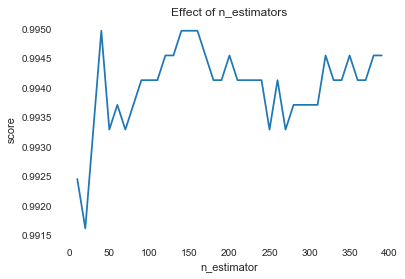

In [10]:
train_X, val_X, train_y, val_y = train_test_split(train, y,test_size=0.1, random_state = 0)
model=RandomForestClassifier(n_jobs=-1,random_state=0)

n_estimators = np.arange(10, 400, 10)
scores = []
recall_score=[]
for n in n_estimators:
    model.set_params(n_estimators=n)
    model.fit(train_X, train_y)
    scores.append(model.score(val_X, val_y))
    
print(scores)  

#Ploting the scores for each estimator value    
plt.title("Effect of n_estimators")
plt.xlabel("n_estimator")
plt.ylabel("score")
plt.plot(n_estimators, scores)

Based on the above test, we can observe that the best results, when the number of estomators are 40. Hence building a final model accordingly to predict whether the server is hacked or not

In [11]:
final_model=RandomForestClassifier(n_jobs=-1,n_estimators=40,random_state=0)

Just to cross check, I am testing the recall score using the final model with the above split test data

In [13]:
from sklearn.metrics import recall_score
final_model.fit(train_X, train_y)
y_pred=final_model.predict(val_X)

print(recall_score(np.array(val_y),np.array(y_pred),average='weighted'))

0.9949706621961442


Since, we got satisfactory results, I am using this model to finally predict the hack incidents using the test dataset.

In [ ]:
final_model.fit(train, y)
predictions = final_model.predict(test)

Saving the results to local

In [ ]:
test_incident_id=(test_dataset['INCIDENT_ID'])
submission=pd.DataFrame(test_incident_id)
submission['MULTIPLE_OFFENSE']=predictions
submission_file=submission.to_csv("F:\\Machine Learning\\HackerEarth\\Novartis Challenge\\Challenge 1 - Hack Prediction\\6a62a5b4967411ea\\Dataset\\sample_submission.csv",index = None, header=True)